# Explainable AI (XAI) - LIME (Local Interpretable Model-Agnostic Explanations)

- Explainable AI (XAI) methods, such as LIME, allow to explain and interpret the predictions of machine learning models. They offer a solution for the trade-off between interpretability and performance, i. e. between complex models that can handle large and versatile data sets and less complex models that are much easier to interpret, but usually also less performant.

- XAI method LIME (Local Interpretable Model-agnostic Explanations) helps to illuminate a machine learning model and to make its predictions individually comprehensible. The method explains the classifier for a specific single instance and is therefore suitable for local explanations.

Documentation :
1. https://lime-ml.readthedocs.io/
2. https://christophm.github.io/interpretable-ml-book/lime.html


# Importing Libraries

In [1]:
#Data Manipulation
import numpy as np
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,10)
import matplotlib.lines as mlines

import warnings
warnings.filterwarnings("ignore")

# Set Options
pd.set_option('display.max_rows', 800)
pd.set_option('display.max_columns', 500)
%matplotlib inline


# Loading Dataset

In [2]:
# Uploading saved dataframe csv file from google drive
! gdown --id 1cfNXnd6oMsqb0gH-yn54Rtaf7VgCsDSX

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1cfNXnd6oMsqb0gH-yn54Rtaf7VgCsDSX
From (redirected): https://drive.google.com/uc?id=1cfNXnd6oMsqb0gH-yn54Rtaf7VgCsDSX&confirm=t&uuid=059dbd0a-5c6d-46a2-b219-ff4f4bb5fc71
To: /content/df_1.csv
100% 788M/788M [00:04<00:00, 169MB/s]


In [3]:
%%time
# Load Data
df   = pd.read_csv('/content/df_1.csv')

CPU times: user 21.8 s, sys: 10.3 s, total: 32.1 s
Wall time: 32.8 s


In [4]:
df.head()

,isFraud,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card3_missing_flag,card4_missing_flag,card5_missing_flag,card6_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D1_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V95_missing_flag,V96_missing_flag,V97_missing_flag,V98_missing_flag,V99_missing_flag,V100_missing_flag,V101_missing_flag,V102_missing_flag,V103_missing_flag,V104_missing_flag,V105_missing_flag,V106_missing_flag,V107_missing_flag,V108_missing_flag,V109_missing_flag,V110_missing_flag,V111_missing_flag,V112_missing_flag,V113_missing_flag,V114_missing_flag,V115_missing_flag,V116_missing_flag,V117_missing_flag,V118_missing_flag,V119_missing_flag,V120_missing_flag,V121_missing_flag,V122_missing_flag,V123_missing_flag,V124_missing_flag,V125_missing_flag,V126_missing_flag,V127_missing_flag,V128_missing_flag,V129_missing_flag,V130_missing_flag,V131_missing_flag,V132_missing_flag,V133_missing_flag,V134_missing_flag,...,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V

In [5]:
# Reduce the number of rows
df = df.sample(frac=0.3, random_state=42)

# Check the shape of the reduced DataFrame
df.shape

(177162, 534)

# Model Building

In [6]:
# Split the y variable series and X variables dataset
X = df.drop(['isFraud'],axis=1)
y = df.isFraud.astype(bool)

In [7]:
# Split the dataset into the training set and test set
from   sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [8]:
print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(124013, 533) (124013,)
(53149, 533) (53149,)


In [9]:
# Head of X_train
X_train.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card3_missing_flag,card4_missing_flag,card5_missing_flag,card6_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D1_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V95_missing_flag,V96_missing_flag,V97_missing_flag,V98_missing_flag,V99_missing_flag,V100_missing_flag,V101_missing_flag,V102_missing_flag,V103_missing_flag,V104_missing_flag,V105_missing_flag,V106_missing_flag,V107_missing_flag,V108_missing_flag,V109_missing_flag,V110_missing_flag,V111_missing_flag,V112_missing_flag,V113_missing_flag,V114_missing_flag,V115_missing_flag,V116_missing_flag,V117_missing_flag,V118_missing_flag,V119_missing_flag,V120_missing_flag,V121_missing_flag,V122_missing_flag,V123_missing_flag,V124_missing_flag,V125_missing_flag,V126_missing_flag,V127_missing_flag,V128_missing_flag,V129_missing_flag,V130_missing_flag,V131_missing_flag,V132_missing_flag,V133_missing_flag,V134_missing_flag,V135_missing_flag,...,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_miss

Handling Missing Values - Imputation

In [10]:
from sklearn.impute import KNNImputer, SimpleImputer

# replace inf
X_train = X_train.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# Impute
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
# imputer = KNNImputer(n_neighbors=3)

X_train_imputed = imputer.fit_transform(X_train)
X_train_imputed = pd.DataFrame(X_train_imputed, columns=X_train.columns)
X_train_imputed.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card3_missing_flag,card4_missing_flag,card5_missing_flag,card6_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D1_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V95_missing_flag,V96_missing_flag,V97_missing_flag,V98_missing_flag,V99_missing_flag,V100_missing_flag,V101_missing_flag,V102_missing_flag,V103_missing_flag,V104_missing_flag,V105_missing_flag,V106_missing_flag,V107_missing_flag,V108_missing_flag,V109_missing_flag,V110_missing_flag,V111_missing_flag,V112_missing_flag,V113_missing_flag,V114_missing_flag,V115_missing_flag,V116_missing_flag,V117_missing_flag,V118_missing_flag,V119_missing_flag,V120_missing_flag,V121_missing_flag,V122_missing_flag,V123_missing_flag,V124_missing_flag,V125_missing_flag,V126_missing_flag,V127_missing_flag,V128_missing_flag,V129_missing_flag,V130_missing_flag,V131_missing_flag,V132_missing_flag,V133_missing_flag,V134_missing_flag,V135_missing_flag,...,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_miss

In [14]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics  import classification_report
from sklearn.metrics  import accuracy_score
# from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics  import roc_auc_score
# from sklearn.metrics  import plot_roc_curve
from sklearn.metrics import precision_recall_curve
# from sklearn.metrics  import plot_precision_recall_curve

In [20]:
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    RocCurveDisplay,
    PrecisionRecallDisplay
)
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ", accuracy_score(y_actual, y_predicted))
    print("\n AUC - ROC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Classification Report : \n\n", classification_report(y_actual, y_predicted))
    print("\n Confusion Matrix : \n\n", confusion_matrix(y_actual, y_predicted))

    # Confusion Matrix Plot using ConfusionMatrixDisplay
    cm = confusion_matrix(y_actual, y_predicted)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
    disp.plot(cmap='plasma', values_format='d')
    plt.show()

    # AUC - ROC Curve using RocCurveDisplay
    RocCurveDisplay.from_estimator(model, X=x_test, y=y_actual, y_predicted=y_predicted_prob)
    plt.show()

    # Precision-Recall Curve using PrecisionRecallDisplay
    PrecisionRecallDisplay.from_estimator(model, X=x_test, y=y_actual, y_predicted=y_predicted_prob)
    plt.show()


## Model Fitting

In [21]:
%%time
# Define the model
from lightgbm import LGBMClassifier
lgbc = LGBMClassifier(random_state=42, max_depth=20, n_estimators=100, num_leaves=256)

# Train the model
lgbc.fit(X_train_imputed,y_train)

lgbc

[LightGBM] [Info] Number of positive: 4386, number of negative: 119627
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.418397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19167
[LightGBM] [Info] Number of data points in the train set: 124013, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.035367 -> initscore=-3.305961
[LightGBM] [Info] Start training from score -3.305961
CPU times: user 23 s, sys: 180 ms, total: 23.1 s
Wall time: 24.1 s


LGBMClassifier(max_depth=20, num_leaves=256, random_state=42)

In [22]:
# Impute X_Test before predicting
X_test_imputed = imputer.transform(X_test)

# Prediction
y_pred_lgbc = lgbc.predict(X_test_imputed)
y_prob_pred_lgbc = lgbc.predict_proba(X_test_imputed)
y_prob_pred_lgbc = [x[1] for x in y_prob_pred_lgbc]
print("Y predicted : ",y_pred_lgbc)
print("Y probability predicted : ",y_prob_pred_lgbc[:5])

Y predicted :  [False False False ... False False False]
Y probability predicted :  [0.0024768014074784527, 0.003520348835805541, 0.0011615558962248854, 0.003266946537126845, 0.0005196884423379668]


## Model Evaluation


 Accuracy Score :  0.9783062710493142

 AUC - ROC Score :  0.9323734988525169

 Classification Report : 

               precision    recall  f1-score   support

       False       0.98      1.00      0.99     51194
        True       0.91      0.45      0.61      1955

    accuracy                           0.98     53149
   macro avg       0.95      0.73      0.80     53149
weighted avg       0.98      0.98      0.97     53149


 Confusion Matrix : 

 [[51109    85]
 [ 1068   887]]


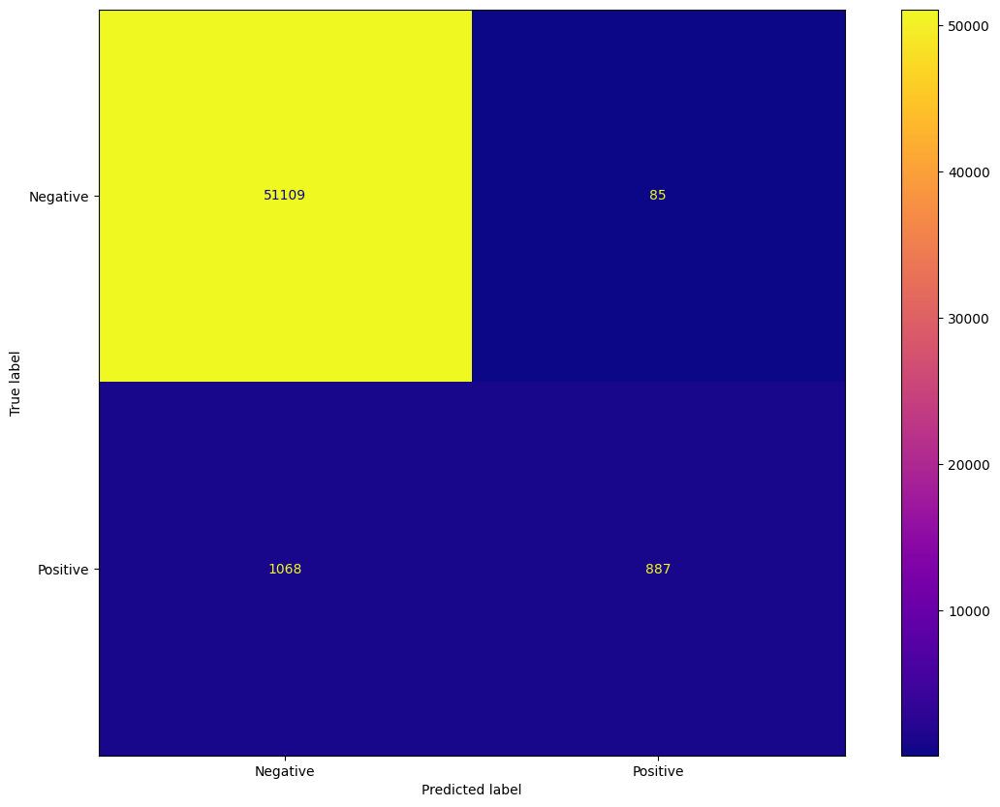

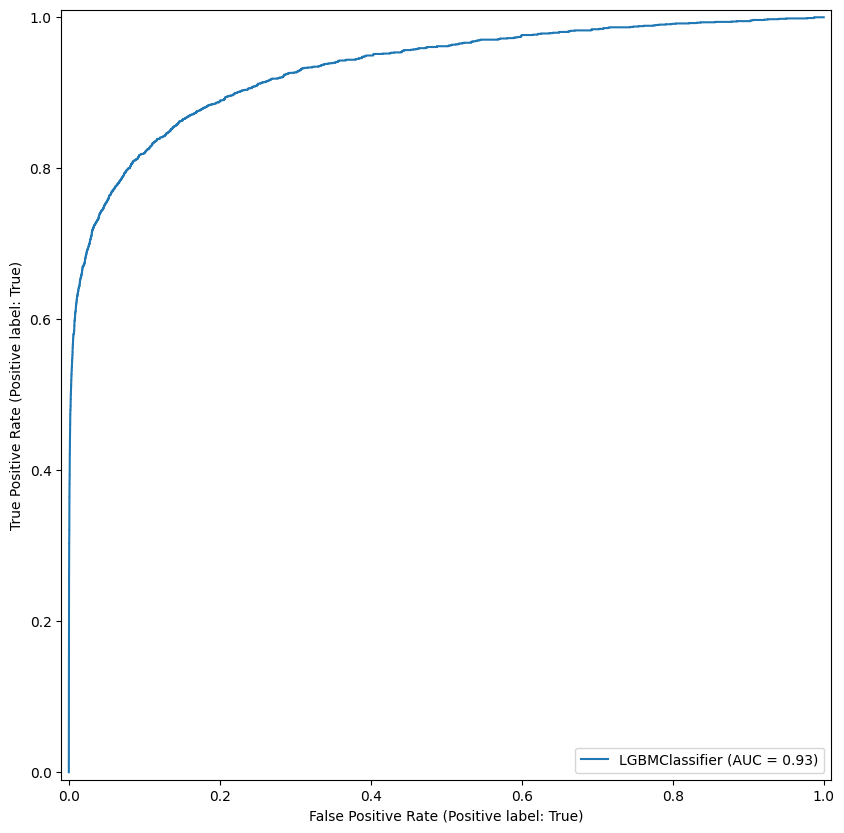

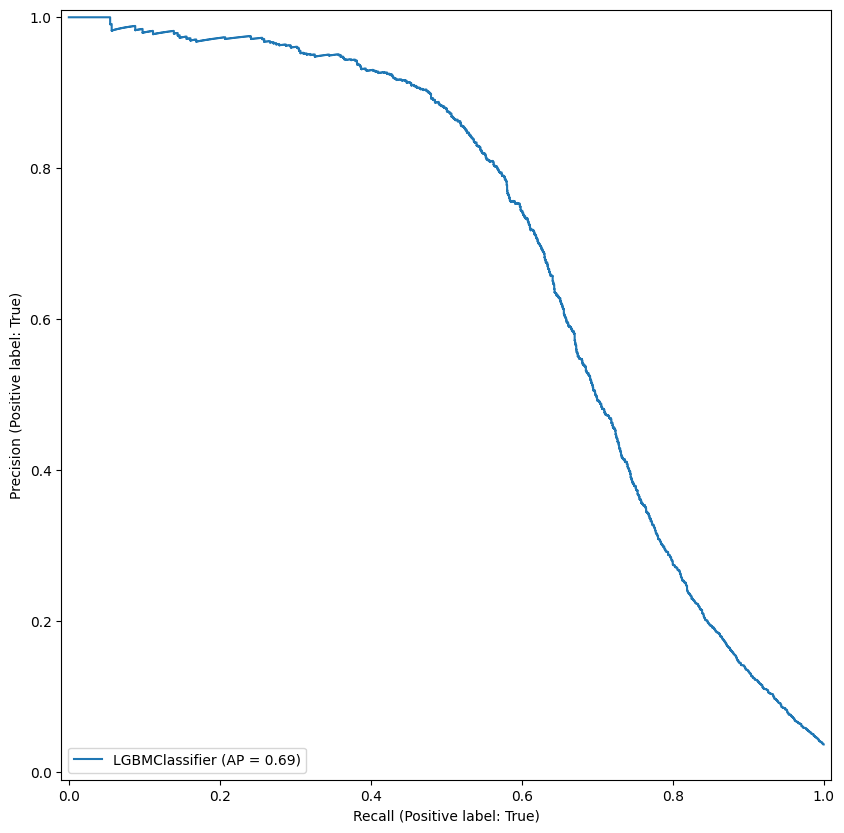

In [25]:
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    RocCurveDisplay,
    PrecisionRecallDisplay
)
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ", accuracy_score(y_actual, y_predicted))
    print("\n AUC - ROC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Classification Report : \n\n", classification_report(y_actual, y_predicted))
    print("\n Confusion Matrix : \n\n", confusion_matrix(y_actual, y_predicted))

    # Confusion Matrix Plot using ConfusionMatrixDisplay
    cm = confusion_matrix(y_actual, y_predicted)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
    disp.plot(cmap='plasma', values_format='d')
    plt.show()

    # AUC - ROC Curve using RocCurveDisplay
    RocCurveDisplay.from_estimator(model, X=x_test, y=y_actual, response_method="predict_proba")
    plt.show()

    # Precision-Recall Curve using PrecisionRecallDisplay
    PrecisionRecallDisplay.from_estimator(model, X=x_test, y=y_actual, response_method="predict_proba")
    plt.show()

# Compute Evaluation Metric
compute_evaluation_metric(lgbc, X_test_imputed, y_test, y_pred_lgbc, y_prob_pred_lgbc)


## Feature Selection

Feature importance refers to techniques that assign a score to input features based on how useful they are at predicting a target variable.

In [26]:
lgbc.feature_importances_

array([ 343,   63, 1204,  905,  113,  104,  391,  140,  777,   16,  411,
        386,  164,  307,  243,   10,   40,   76,  149,   10,   69,  130,
         58,  177,   67,  393,  181,  284,  239,  212,  265,  145,   46,
        230,  107,  242,  171,   33,   38,   84,  293,    1,   27,   53,
         97,   91,  104,   40,   34,   49,  117,  390,   35,    7,  148,
        129,   22,    2,   28,   10,  130,   57,   19,   17,   28,  220,
        301,    6,    2,   31,   79,   24,  117,    7,    2,    2,    6,
         42,   20,  244,   27,    0,    0,   12,    0,    0,    0,   23,
         18,   13,    0,    0,   16,   11,    2,   10,    5,    4,    0,
          0,    1,    1,    3,    2,    3,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [27]:
feature_importance_df = pd.DataFrame({'feature' : X_train_imputed.columns, 'importance' : lgbc.feature_importances_ })

In [28]:
feature_importance_df = feature_importance_df.head(15).sort_values(by="importance", ascending=False)
feature_importance_df = feature_importance_df.iloc[:30,:]
feature_importance_df

,feature,importance
2,card1,1204
3,card2,905
8,addr1,777
10,dist1,411
6,card5,391
11,P_emaildomain,386
0,TransactionAmt,343
13,C1,307
14,C2,243
12,R_emaildomain,164


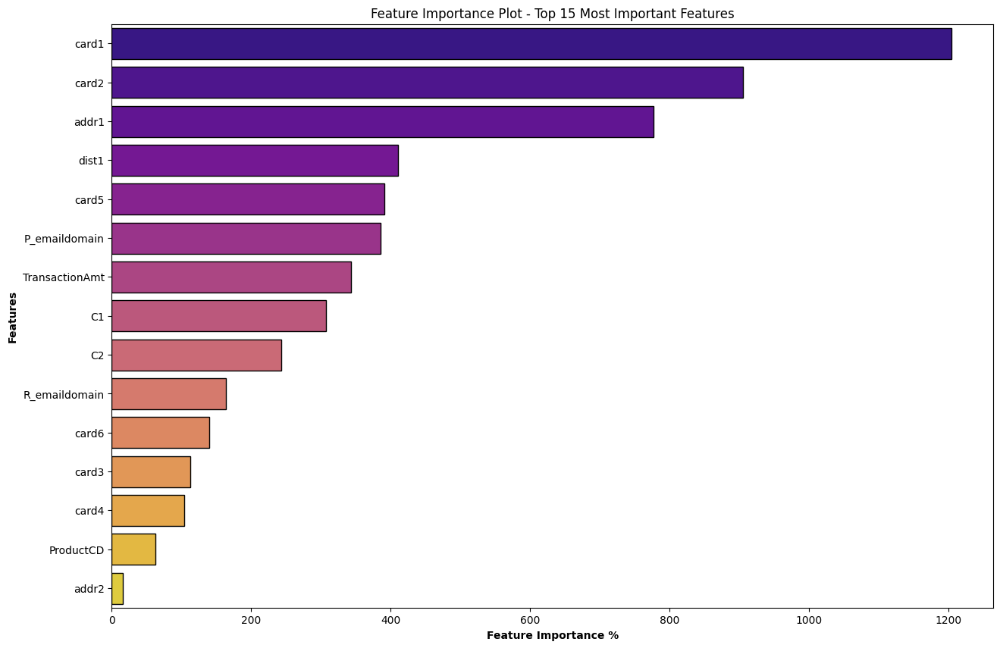

In [29]:
plt.figure(figsize=(15, 10));
sns.barplot(x="importance", y="feature", data=feature_importance_df.head(15).sort_values(by="importance", ascending=False),
            palette= 'plasma',edgecolor = 'black',linewidth = 1);
plt.title('Feature Importance Plot - Top 15 Most Important Features')
plt.xlabel('Feature Importance %',weight='bold')
plt.ylabel('Features',weight='bold');

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- card1 is contributing the most in predicting if a financial transaction is fraud or legitimate
- card2, addr1, P_emaildomain, etc are some of the most important features in predicting the fraud
- Certain card types, addresses and emails are at high risk of fraud, so there is a need to monitor these carefully

# LIME

In [30]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=fce02a64dc7041eb567ab0bb9dfd10e6cdb6b8cced50dd6c0ed25b4678bcbae9
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [31]:
#lime package (https://github.com/marcotcr/lime)
import lime
import lime.lime_tabular

In [32]:
interpretor = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_imputed),
    feature_names=X_train_imputed.columns,
    class_names=["Not Fraud", "Fraud"],
     mode="classification",
    verbose=True,
     random_state= 42)

Intercept 0.07163933210417131
Prediction_local [0.0229014]
Right: 0.0005196884423379668


CPU times: user 1.33 s, sys: 344 ms, total: 1.68 s
Wall time: 1.24 s


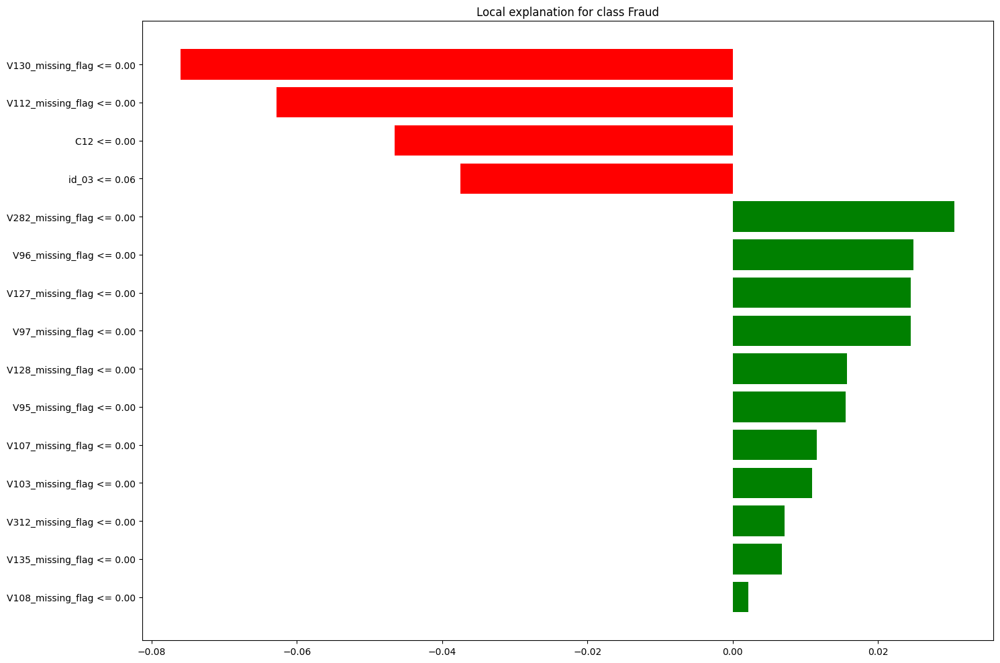

In [33]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[4], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)

plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

Intercept 0.2810017600022303
Prediction_local [0.0920561]
Right: 0.004125247672768118


CPU times: user 1.55 s, sys: 190 ms, total: 1.74 s
Wall time: 1.72 s


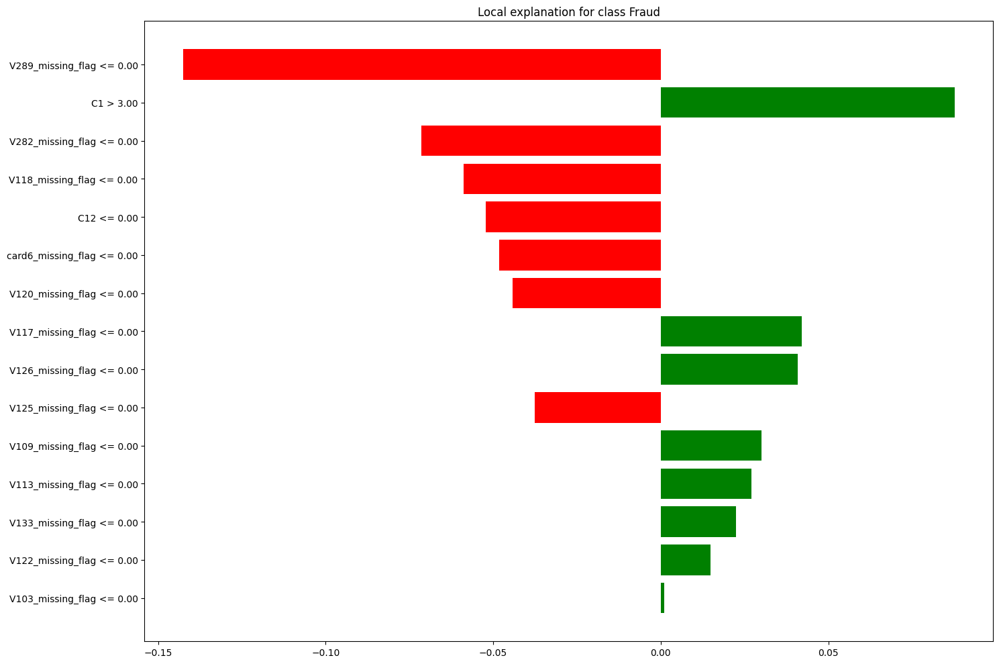

In [34]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[24], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)

plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

Intercept 0.42939665843751135
Prediction_local [0.02462785]
Right: 0.0005893739222209378


CPU times: user 1.82 s, sys: 225 ms, total: 2.04 s
Wall time: 2.41 s


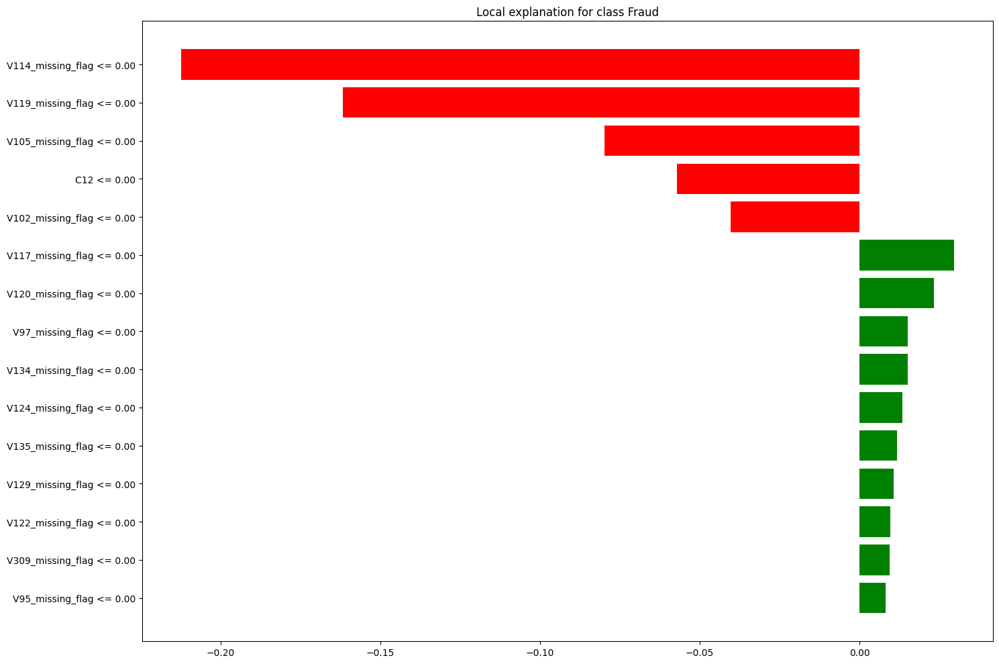

In [35]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[8], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

Intercept 0.07155552412756719
Prediction_local [0.07794909]
Right: 0.0017859693388542367


CPU times: user 1.53 s, sys: 195 ms, total: 1.72 s
Wall time: 2.53 s


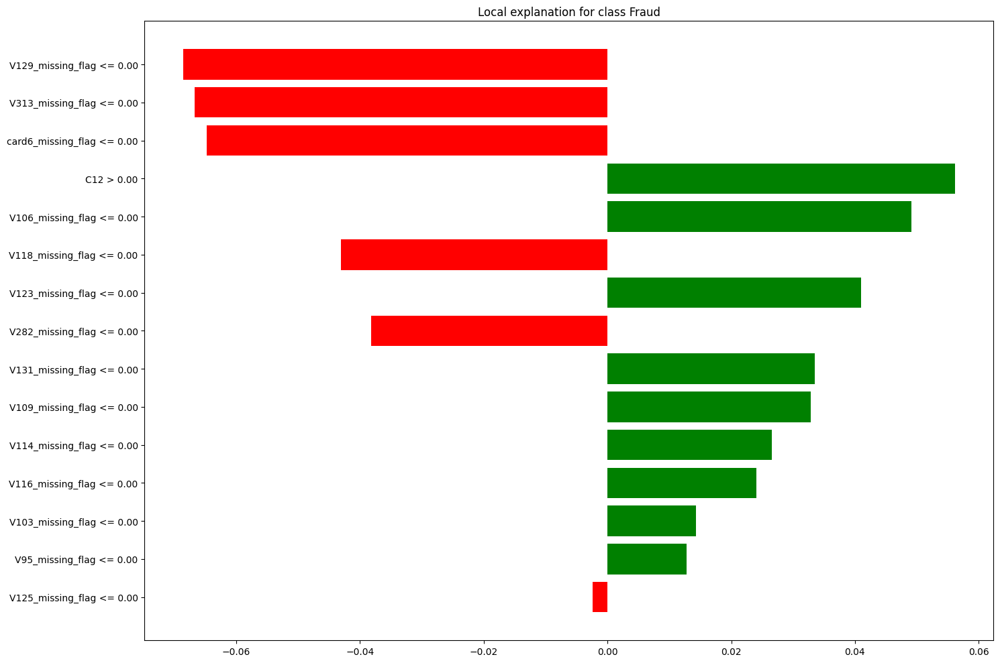

In [36]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[9], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

In [37]:
y_pred_lgbc[0:100]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

Intercept 0.41903535907929834
Prediction_local [0.10607036]
Right: 0.0007334945064150359


CPU times: user 1.24 s, sys: 274 ms, total: 1.51 s
Wall time: 1.11 s


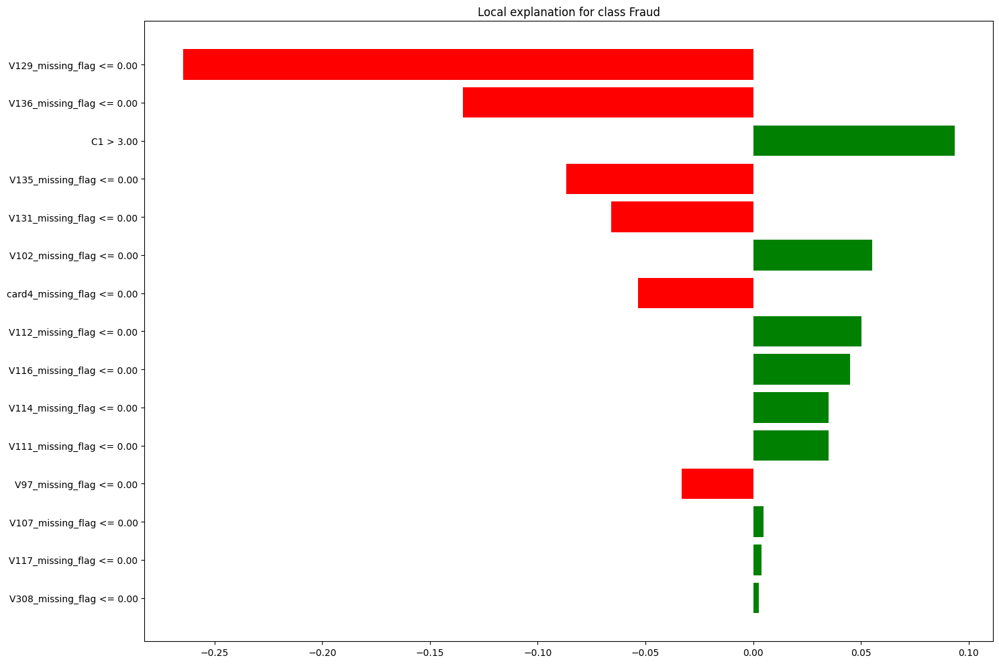

In [38]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[55], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

Intercept 0.15581757991125703
Prediction_local [0.0873657]
Right: 0.006109755439180103


CPU times: user 1.12 s, sys: 226 ms, total: 1.35 s
Wall time: 1.02 s


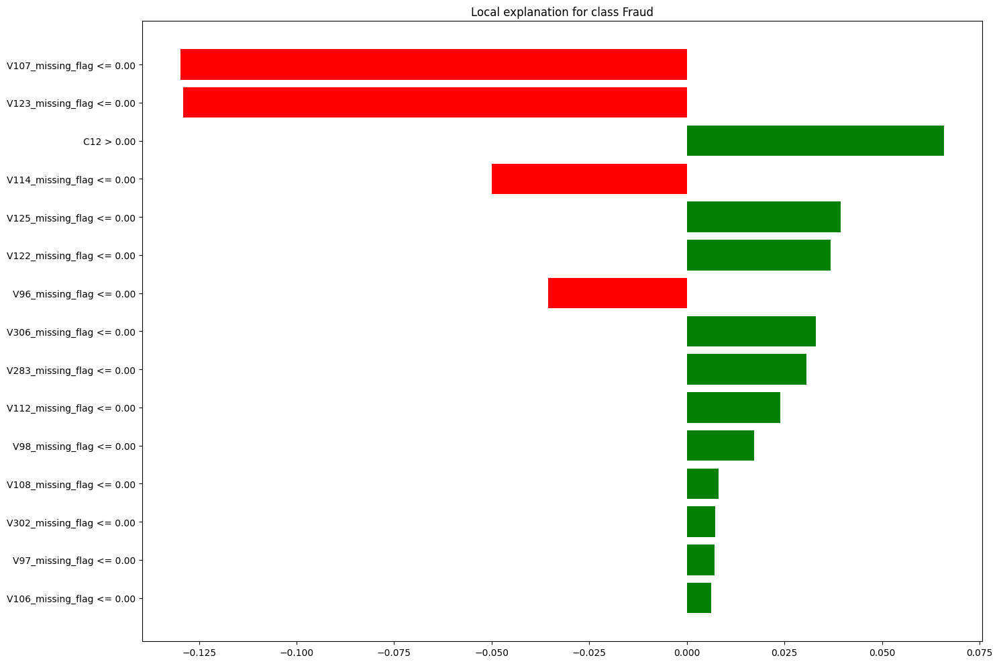

In [39]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[65], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

Intercept 0.31836732943361845
Prediction_local [0.02397453]
Right: 0.003039675269554276


CPU times: user 1.2 s, sys: 314 ms, total: 1.52 s
Wall time: 1.13 s


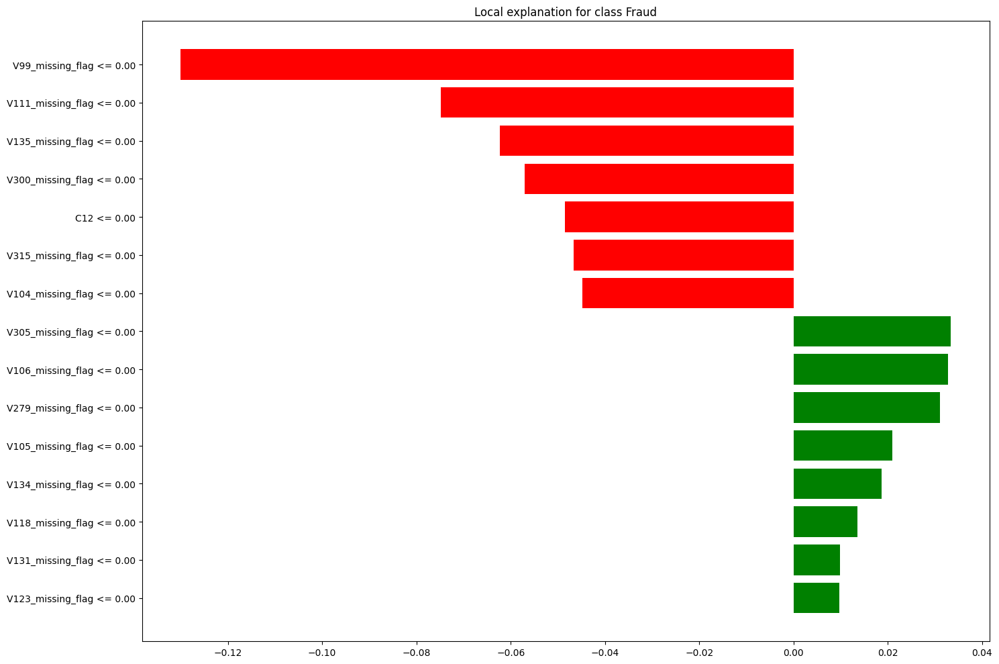

In [40]:
%%time
exp = interpretor.explain_instance(
    data_row=X_test_imputed[58], ##new data
    predict_fn=lgbc.predict_proba,
    num_features = 15
)
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)